In [ ]:
! sudo apt-get -y install wget git
! wget --no-check-certificate -P . https://dumps.wikimedia.org/fawiki/latest/fawiki-latest-pages-articles-multistream.xml.bz2
! bzip2 -d fawiki-latest-pages-articles-multistream.xml.bz2
! pip install wikiextractor
! python -m wikiextractor.WikiExtractor --json fawiki-latest-pages-articles-multistream.xml




git is already the newest version (1:2.25.1-1ubuntu3.6).
wget is already the newest version (1.20.3-1ubuntu2).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
--2022-12-02 15:13:22--  https://dumps.wikimedia.org/fawiki/latest/fawiki-latest-pages-articles-multistream.xml.bz2
Resolving dumps.wikimedia.org (dumps.wikimedia.org)... 208.80.154.142, 2620:0:861:2:208:80:154:142
Connecting to dumps.wikimedia.org (dumps.wikimedia.org)|208.80.154.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1121538365 (1.0G) [application/octet-stream]
Saving to: ‘./fawiki-latest-pages-articles-multistream.xml.bz2’

atest-pages-article  24%[==

*** WARNING: max output size exceeded, skipping output. ***

fawiki-latest-pages 100%[===================>]   1.04G  4.43MB/s    in 4m 6s   

2022-12-02 15:17:28 (4.34 MB/s) - ‘./fawiki-latest-pages-articles-multistream.xml.bz2’ saved [1121538365/1121538365]

     |████████████████████████████████| 46 kB 3.4 MB/s 
You sho

In [2]:
# !export all_proxy=""
!pip install pyspark


  Using cached pyspark-3.3.1.tar.gz (281.4 MB)
  Preparing metadata (setup.py) ... done
  Using cached py4j-0.10.9.5-py2.py3-none-any.whl (199 kB)
  Created wheel for pyspark: filename=pyspark-3.3.1-py2.py3-none-any.whl size=281845513 sha256=4aae241a3637ae0f4d0be686b218974832c34c9850e58baecdd4b0dc44ce1072
  Stored in directory: /home/hermes/.cache/pip/wheels/43/dc/11/ec201cd671da62fa9c5cc77078235e40722170ceba231d7598
Successfully built pyspark


In [3]:
!pip install findspark

  Using cached findspark-2.0.1-py2.py3-none-any.whl (4.4 kB)


In [2]:

from pyspark.sql import SparkSession
import time
import findspark
findspark.init()

spark = SparkSession \
    .builder \
    .appName("MDA_2021") \
    .master("local[*]") \
    .config("spark.driver.memory", "15g") \
    .getOrCreate()

sc=spark.sparkContext
# sc.setSystemProperty('spark.executor.memory', '8G')

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


22/12/04 16:22:13 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [3]:
articles_rdd = sc.textFile("text/*/*")

In [4]:
import json
import time
# Jsonify
json_rdd = articles_rdd.map(lambda x : json.loads(x))


In [5]:
def cleansing(x):
    dirty_words=['\u200c','\n','(',')','-','.',',',"<<",">>",'"',":","»","«","،","[","]","}","{","?","!","@","#","$","&","*","_",'"',">","<","؛","/",'-','%','+','↓','|','\u200e','\u202d','\u202c','=','ـ','\uf0fc','\u200f','\u200d','%',';','°','//','\u200b','×','.','؟','.','–','۔','\\','^']
    title = x['title']
    text = x['text']
    for word in dirty_words:
        title = title.replace(word," ")
    for word in dirty_words:
        text = text.replace(word, " ")
    title = title.replace("  ", " ")
    text = text.replace("  ", " ")
    x.update({"title" : title})
    x.update({"text" : text})
    return x

cleansed_articles_rdd = json_rdd.map(lambda x : cleansing(x)) #cleansed text
cached_cleansed_articles = cleansed_articles_rdd.persist()


In [6]:
words_rdd = cleansed_articles_rdd.flatMap(lambda x : (x['title'], x['text'])).flatMap(lambda x : x.split(" "))

In [7]:
words_count_rdd = words_rdd.map(lambda x : (x,1)).reduceByKey(lambda x, y : x+y)

In [8]:
top_100 = words_count_rdd.map(lambda x : (x[1], x[0])).sortByKey(False)
lst = top_100.take(100)   

In [9]:
stop_words = ['در','و','به','از','است','که','می','این','','را','های','با','آن','شده','سال','ها','شد','بود','برای','کرد','او','شود','ای','دارد','بر','خود','تا','یا','کند','وی','نیز','باشد','کرده','پس','یکی','بوده','دیگر','دیگر','همچنین','توسط','هم','دیگر','اند','اما','هایی','کنند','هر','مورد','وجود','هستند','داد','داشته','داشت','روی','زیر','دهد','شوند','کردند']
stopwords = ['در','و','به','از','که','','را','این','با','است','آن','برای','او','تا','یا','بر','شده','شدهاست.','شد.','نیز','بود','کرد.','پس','بود.','آنها','دارد','همچنین',')','دارد.','کرد','اما','میتوان','(؛','هر','هم','میشود.','میشود','می','است،','دارای']
new_stopword = ['شدهاست','قرار','میکند','بین','بودهاست','کردهاست','بعد','مانند','بودند','اس','میکنند','برخی','میدهد','گرفت','همراه','میشوند','بسیاری','شدن','دارند','کردن','گرفته','شدند','حدود','میتواند','ولی','شکل','بیش','مربوط','همین','اینکه','باعث','سپس','براساس','یافت','همان','میشد','قابل','اگر','میکرد','گفته','همه','دیگری','نمود','معمولاً','خواهد','سوی','طی','آنجا','یعنی','رسید','جای','دربارهٔ','کنار','حتی','سایر','شدهاند','چندین','چنین','میگیرد','رفت', 'پی','هنگام','مقابل','بی','بودن','حالی','آمد','گردید','فقط','آنان','داشتند','اغلب','رسیده','کلی','چه','باز','مثال','علاوه','دادن','میکردند','رو','باشند','میرود','منجر','ندارد','کردهاند','دیده','میدهند','داخل','هاي','میرسد', 'هنوز', 'وقتی', 'ان', 'مثل', 'اوایل', 'هنگامی', 'باقی', 'میگوید', 'دادند', 'نامیده', 'آمده', 'بعضی', 'یکدیگر', 'موجب', 'بعدها', 'پيش', 'تر', 'میآید', 'کمی', 'گرفتن', 'البته', 'البته', 'بلکه', 'گاهی', 'کسی', 'درون', 'خودش', 'نامهای','یافته', 'جایی', 'مدتی', 'اي', 'میگردد','کاملاً', 'سرانجام', 'تمامی', 'اکنون', 'اگرچه', 'تعدادی', 'چیزی']
stp = stop_words + stopwords + new_stopword

In [10]:
def remove_words(x, words):
    title = x['title'].split(" ")
    lst = []
    for w in title:
        if w not in words:
            lst.append(w)
    while '' in lst:
        lst.remove('')

    str_1 = " ".join(lst)
    x.update({'title':str_1})
    text = x['text'].split(" ")
    lst = []
    for w in text:
        if w not in words:
            lst.append(w)
    while '' in lst:
        lst.remove('')

    str_2 = " ".join(lst)
    x.update({'text': str_2})
    return x

articles_without_stopwords_rdd = cached_cleansed_articles.map(lambda x : remove_words(x, stp))

In [14]:
MIN_COUNT = 20
uncommon_words = top_100.filter(lambda x : x[0] < MIN_COUNT).map(lambda x : x[1]).collect()

Time taken: 0.035min


In [11]:
MIN_COUNT = 20
common_words = top_100.filter(lambda x : x[0] > MIN_COUNT).map(lambda x : x[1]).collect()

In [12]:
hash_list = {}
HASH_SIZE = 401
for i in range(HASH_SIZE):
    hash_list[str(i)] = []

for i in common_words:
    if len(i) != 0:
        hash_list[str((ord(i[0])+ord(i[-1]))*len(i)%HASH_SIZE)].append(i)

def remove_uncommon(x, dic):    
    title = x['title'].split(" ")
    lst = []
    for w in title:
        if len(w) > 0:
            hashed_w = str((ord(w[0])+ord(w[-1]))*len(w)%HASH_SIZE)
            if w in dic[hashed_w]:
                lst.append(w)
    str_1 = " ".join(lst)
    x.update({'title': str_1})
    text = x['text'].split(" ")
    lst = []
    for w in text:
        if len(w) > 0:
            hashed_w = str((ord(w[0])+ord(w[-1]))*len(w)%HASH_SIZE)
            if w in dic[hashed_w]:
                lst.append(w)
    str_2 = " ".join(lst)
    x.update({'text': str_2})
    return x


articles_cleaned_rdd = articles_without_stopwords_rdd.map(lambda x : remove_uncommon(x, hash_list))
articles_cleaned_rdd_cache = articles_cleaned_rdd.cache()

* How many unique 3-Letter words remain after the cleaning procedure?

In [15]:
unique_3_letter = articles_cleaned_rdd.flatMap(lambda x : (x['title'], x['text'])).flatMap(lambda x : x.split(" ")).filter(lambda x : len(x) == 3).distinct().count()
unique_3_letter

9438

* What are the top 20 most common English trigrams in the corpus?

In [16]:
def trigram(text, size=3):
    tokens = text.split()
    return [' '.join(tokens[i:i+size]) for i in range(len(tokens) - size + 1)]
    
def finding_english(x):
    y = x.split(" ")
    if len(x) > 2:
        if ('a' <= y[0] <= "z" or 'A' <= y[0] <='Z') and ('a' <= y[1] <= "z" or 'A' <= y[1] <='Z') and ('a' <= y[2] <= "z" or 'A' <= y[2] <='Z'):
            return x
    
s = articles_cleaned_rdd.flatMap(lambda x : (x['title'], x['text'])).flatMap(lambda x : trigram(x)).filter(lambda x : finding_english(x)).map(lambda x : (x,1)).reduceByKey(lambda x, y: x + y).map(lambda x : (x[1], x[0])).sortByKey(False)
trigrams = s.collect()



In [17]:
trigrams[:20]

[(4796, 'en wikipedia org'),
 (3722, 'http en wikipedia'),
 (3645, 'The Free Encyclopedia'),
 (3645, 'Wikipedia The Free'),
 (3471, 'w index php'),
 (3470, 'wikipedia org w'),
 (3470, 'org w index'),
 (3456, 'index php title'),
 (2814, 'Free Encyclopedia http'),
 (2809, 'Encyclopedia http en'),
 (2468, 'amp oldid accessed'),
 (1893, "women's national under"),
 (1571, 'wikipedia org wiki'),
 (1254, 'lt timestamp gt'),
 (1254, 'lt contributor gt'),
 (1254, 'gt lt contributor'),
 (1254, 'lt ns gt'),
 (1254, 'contributor gt lt'),
 (1252, 'lt format gt'),
 (1252, 'lt model gt')]

Plot a distribution from document lengths using appropriate bin sizes with 100 bins

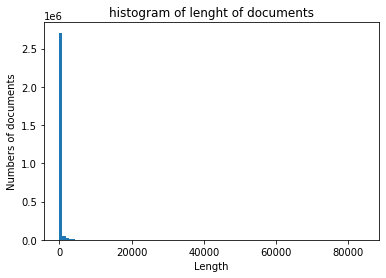

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
articles_length_rdd= articles_cleaned_rdd.map(lambda x: len(x['text']))
articles_length_list = articles_length_rdd.collect()
# plotting histogram of lenght of documents
max_length=max(articles_length_list)
number_bins=100
bin_width=max_length/number_bins                  # detemine width of bins
plt.hist(articles_length_list, bins=np.arange(0, max_length + bin_width, bin_width))
plt.title('histogram of lenght of documents')
plt.ylabel('Numbers of documents')
plt.xlabel('Length')
plt.show()

What are the titles and urls of the 5 longest articles?

In [148]:
articles_cleaned_rdd.map(lambda x : ((len(x['text'])), x['title'], x['url'])).sortBy(lambda x : x[0], False).take(5)

[(84287, 'نادرشاه', 'https://fa.wikipedia.org/wiki?curid=10787'),
 (82202, 'ایران', 'https://fa.wikipedia.org/wiki?curid=163930'),
 (81169, 'نبرد اسمولنسک', 'https://fa.wikipedia.org/wiki?curid=2322946'),
 (76909, 'نبرد مسکو', 'https://fa.wikipedia.org/wiki?curid=1501875'),
 (76219, 'جمهوری وایمار', 'https://fa.wikipedia.org/wiki?curid=26519')]

How many and what percentage of articles contain these words? [History, Politics, Medicine, Law, Economics, Engineering]

In [15]:
cnt = articles_cleaned_rdd_cache.filter(lambda x : ("History" in x['text']) or ("Politics" in x['text']) or ("Medicine" in x['text']) \
    or ("Law" in x['text']) or ("Economics" in x['text']) or ("Engineering" in x['text']))

print(cnt.count()/articles_cleaned_rdd.count()*100)

0.020975215299686517


In [16]:
doc_map = cnt.flatMap(lambda x: [((x['id'],i),1) for i in x['text'].split()]).reduceByKey(lambda x, y: x+y).sortByKey(False)


In [127]:
doc_map.take(100)

[(('972665', '—'), 1),
 (('972665', '۴'), 1),
 (('972665', 'یکپارچه'), 1),
 (('972665', 'یک'), 11),
 (('972665', 'یابی'), 1),
 (('972665', 'یابد'), 1),
 (('972665', 'گیری'), 5),
 (('972665', 'گیرد'), 1),
 (('972665', 'گوگل'), 1),
 (('972665', 'گونه'), 2),
 (('972665', 'گفت'), 1),
 (('972665', 'گسترش'), 1),
 (('972665', 'گریو'), 2),
 (('972665', 'گریزی'), 1),
 (('972665', 'گروه'), 1),
 (('972665', 'گردد'), 1),
 (('972665', 'گرداند'), 1),
 (('972665', 'گذاری'), 10),
 (('972665', 'گذاران'), 1),
 (('972665', 'گان'), 2),
 (('972665', 'کنید'), 2),
 (('972665', 'کمتر'), 1),
 (('972665', 'کلیدی'), 1),
 (('972665', 'کلاسیک'), 1),
 (('972665', 'کل'), 1),
 (('972665', 'کدهای'), 3),
 (('972665', 'کتاب'), 1),
 (('972665', 'کالا'), 1),
 (('972665', 'کارشناسی'), 1),
 (('972665', 'کاربردی'), 1),
 (('972665', 'کار'), 1),
 (('972665', 'چگونه'), 1),
 (('972665', 'چاپ'), 1),
 (('972665', 'پیوندی'), 1),
 (('972665', 'پیوند'), 1),
 (('972665', 'پیشنهاد'), 2),
 (('972665', 'پیش'), 1),
 (('972665', 'پیدا'), 1

In [128]:
aggregated_doc = doc_map.reduceByKey(lambda x, y: x+y).sortByKey(False)
vc = aggregated_doc.take(100)
vc

[(('972665', '—'), 1),
 (('972665', '۴'), 1),
 (('972665', 'یکپارچه'), 1),
 (('972665', 'یک'), 11),
 (('972665', 'یابی'), 1),
 (('972665', 'یابد'), 1),
 (('972665', 'گیری'), 5),
 (('972665', 'گیرد'), 1),
 (('972665', 'گوگل'), 1),
 (('972665', 'گونه'), 2),
 (('972665', 'گفت'), 1),
 (('972665', 'گسترش'), 1),
 (('972665', 'گریو'), 2),
 (('972665', 'گریزی'), 1),
 (('972665', 'گروه'), 1),
 (('972665', 'گردد'), 1),
 (('972665', 'گرداند'), 1),
 (('972665', 'گذاری'), 10),
 (('972665', 'گذاران'), 1),
 (('972665', 'گان'), 2),
 (('972665', 'کنید'), 2),
 (('972665', 'کمتر'), 1),
 (('972665', 'کلیدی'), 1),
 (('972665', 'کلاسیک'), 1),
 (('972665', 'کل'), 1),
 (('972665', 'کدهای'), 3),
 (('972665', 'کتاب'), 1),
 (('972665', 'کالا'), 1),
 (('972665', 'کارشناسی'), 1),
 (('972665', 'کاربردی'), 1),
 (('972665', 'کار'), 1),
 (('972665', 'چگونه'), 1),
 (('972665', 'چاپ'), 1),
 (('972665', 'پیوندی'), 1),
 (('972665', 'پیوند'), 1),
 (('972665', 'پیشنهاد'), 2),
 (('972665', 'پیش'), 1),
 (('972665', 'پیدا'), 1

In [17]:
doc_map.map(lambda x : ((x[0][0]),(x[0][1],x[1]))).groupByKey().take(10)

[('4394245', <pyspark.resultiterable.ResultIterable at 0x7fcdc0063550>),
 ('439108', <pyspark.resultiterable.ResultIterable at 0x7fcda934b580>),
 ('391879', <pyspark.resultiterable.ResultIterable at 0x7fcda93ecd30>),
 ('3777723', <pyspark.resultiterable.ResultIterable at 0x7fcda93ecac0>),
 ('19806', <pyspark.resultiterable.ResultIterable at 0x7fcda93ece80>),
 ('1093250', <pyspark.resultiterable.ResultIterable at 0x7fcda932ffd0>),
 ('5279887', <pyspark.resultiterable.ResultIterable at 0x7fcda932f760>),
 ('169032', <pyspark.resultiterable.ResultIterable at 0x7fcda932fbe0>),
 ('3491788', <pyspark.resultiterable.ResultIterable at 0x7fcda932f820>),
 ('4408679', <pyspark.resultiterable.ResultIterable at 0x7fcdc0063df0>)]

In [18]:
doc_mat = doc_map.map(lambda x : ((x[0][0]),(x[0][1],x[1]))).groupByKey().map(lambda x : (x[0],list(x[1])))
dm = doc_mat.collect()
dm

[('4394245',
  [('۶۵۰', 1),
   ('۵', 1),
   ('۲۰۱۷', 7),
   ('۲۰۱۶', 4),
   ('۲۰۱۵', 1),
   ('۱۳', 1),
   ('۱۰۰۰', 4),
   ('یک', 18),
   ('گلخانه', 1),
   ('گسترش', 1),
   ('گردش', 1),
   ('گذاری', 3),
   ('گازهای', 1),
   ('کیلومتر', 3),
   ('کپسول', 11),
   ('کویل', 1),
   ('کوتاه', 1),
   ('کنون', 1),
   ('کننده', 1),
   ('کنفرانس', 1),
   ('کنترل', 5),
   ('کمک', 1),
   ('کمپرسور', 3),
   ('کم', 1),
   ('کلیدی', 1),
   ('کف', 1),
   ('کشف', 1),
   ('کربن', 2),
   ('کبک', 1),
   ('کاهش', 4),
   ('کانادایی', 1),
   ('کانادا', 5),
   ('کامل', 1),
   ('کالگری', 1),
   ('کاغذ', 1),
   ('کارمند', 1),
   ('کار', 4),
   ('کابین', 1),
   ('ژوئیه', 1),
   ('ژوئن', 3),
   ('چهار', 1),
   ('چند', 1),
   ('پیوند', 1),
   ('پیشرفته', 3),
   ('پیشرفت', 1),
   ('پیشرانه', 3),
   ('پیش', 1),
   ('پژوهشگران', 1),
   ('پورت', 1),
   ('پروازهای', 1),
   ('پرسرعت', 1),
   ('پردازش', 1),
   ('پذیر', 1),
   ('پایداری', 1),
   ('پایدار', 1),
   ('ویندزور', 3),
   ('وسیله', 2),
   ('وسایل', 6),
   ('وری', 

In [19]:
form = doc_map.map(lambda x : (x[0][1],1)).filter(lambda x : ("History" in x[0]) or ("Politics" in x[0]) or ("Medicine" in x[0]) \
    or ("Law" in x[0] and x[0] != "Lawrence") or ("Economics" in x[0]) or ("Engineering" in x[0])).reduceByKey(lambda x,y : x + y).map(lambda x : (x[1], x[0])).sortByKey(False)
lookup_table = form.collect()

In [20]:
form_2 = doc_map.map(lambda x : (x[0][1],1)).reduceByKey(lambda x,y : x + y).map(lambda x : (x[1], x[0])).sortByKey(False)
lookup_table_2 = form_2.collect()

In [136]:
lookup_table_2

[(485, 'یک'),
 (338, 'عنوان'),
 (297, 'of'),
 (283, 'دو'),
 (275, 'کار'),
 (268, 'نام'),
 (253, 'استفاده'),
 (240, 'داده'),
 (239, 'صورت'),
 (231, 'طور'),
 (224, 'منابع'),
 (220, 'اصلی'),
 (213, 'نظر'),
 (213, 'زمان'),
 (209, 'حال'),
 (208, 'ایجاد'),
 (208, 'and'),
 (206, 'شامل'),
 (205, 'انجام'),
 (204, 'انگلیسی'),
 (202, 'بیشتر'),
 (200, 'توان'),
 (200, 'آمریکا'),
 (194, 'ترین'),
 (193, 'پیش'),
 (192, 'مختلف'),
 (191, 'جمله'),
 (190, 'دست'),
 (189, 'اولین'),
 (188, 'دانشگاه'),
 (188, 'واقع'),
 (185, 'بخش'),
 (184, 'نشان'),
 (183, 'بسیار'),
 (178, 'The'),
 (177, 'تواند'),
 (177, 'سه'),
 (176, 'History'),
 (174, 'توجه'),
 (173, 'دلیل'),
 (172, 'کتاب'),
 (171, 'زندگی'),
 (169, 'the'),
 (169, 'نمی'),
 (167, 'راه'),
 (167, 'شناخته'),
 (167, 'باید'),
 (166, 'چند'),
 (166, 'تاریخ'),
 (166, 'میان'),
 (164, 'شرکت'),
 (164, 'بار'),
 (163, 'تنها'),
 (162, 'متحده'),
 (159, 'منتشر'),
 (158, 'کمک'),
 (158, 'فعالیت'),
 (158, 'جدید'),
 (157, 'ایالات'),
 (156, 'اول'),
 (153, 'زمینه'),
 (153, 'گروه'),

In [23]:
import math

DOCS_LENGTH = doc_mat.count()
DOCS_LENGTH
WORDS_LENGTH = len(lookup_table)

topics = ['History','Politics','Medicine', 'Law', 'Economics', 'Engineering']
def find_index(word, lt):
    index = 0
    for i in lt:
        if i[1] == word:
            return i, index
        index += 1

tf_idf = {}
# for i in range(DOCS_LENGTH):
for k, v in dm:
    words = v
    ls = []
    isUseful = False
    for j in range(len(lookup_table_2)):
        ls.append(0)
    sum_words = 0
    for w in words:
        sum_words += w[1]
    for w in words:
        # print(w)
        # if w[0] in topics:
        tup, index = find_index(w[0], lookup_table_2)
        # print(tup)
        ls[index] = math.log(DOCS_LENGTH/tup[0]) * w[1] / sum_words
        isUseful = True

    if isUseful:
        tf_idf[k] = ls
tf_idf

{'4394245': [0.003981189710348827,
  0.0019188143372366546,
  0,
  0.003381589442340018,
  0.003514501609091658,
  0,
  0.006826706046006991,
  0.0010363683620928216,
  0.001041206567666959,
  0,
  0.0011163137519965894,
  0.0022743853382983423,
  0,
  0.0035239837339003637,
  0.005983143498628537,
  0.0012021862573890828,
  0,
  0.004853527930653605,
  0,
  0,
  0.0024722065409661454,
  0,
  0,
  0,
  0.0012889161424370927,
  0,
  0.0026019730979871766,
  0,
  0.005252736059181711,
  0,
  0.0013193312363825578,
  0.0013379710252025164,
  0.002688503041063988,
  0,
  0,
  0.0013891947708624187,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0.004369748577327953,
  0,
  0,
  0.0014635423307897486,
  0,
  0.0014635423307897486,
  0.02068623115649429,
  0.004432763819248777,
  0,
  0,
  0.003026930747642792,
  0.001520776114485666,
  0.003041552228971332,
  0.006083104457942664,
  0,
  0,
  0.0046741143630440124,
  0,
  0,
  0,
  0,
  0.004696909498198679,
  0,
  0,
  0.003146570064920445,
  0

In [24]:
import pandas as pd
tf_idf_df = pd.DataFrame.from_dict(tf_idf, orient='index')
tf_idf_df

,0,1,2,3,4,5,6,7,8,9,...,29078,29079,29080,29081,29082,29083,29084,29085,29086,29087
4394245,0.003981,0.001919,0.000000,0.003382,0.003515,0.000000,0.006827,0.001036,0.001041,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
439108,0.002017,0.002618,0.000734,0.002831,0.002125,0.001521,0.001815,0.000579,0.001356,0.000603,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
391879,0.003753,0.000000,0.000000,0.004099,0.006390,0.002202,0.002364,0.002512,0.012620,0.002620,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3777723,0.002714,0.002616,0.003229,0.003458,0.001797,0.003716,0.003989,0.000000,0.004259,0.004420,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19806,0.002011,0.003876,0.000000,0.000512,0.001597,0.006056,0.007683,0.010677,0.003155,0.001310,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3813417,0.000000,0.000000,0.000000,0.000000,0.003970,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6015574,0.002309,0.013354,0.013736,0.000000,0.000000,0.003161,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
310564,0.000000,0.000000,0.036498,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5570726,0.002926,0.006446,0.000000,0.000533,0.000830,0.000286,0.008601,0.065284,0.002951,0.004084,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
history = find_index("History", lookup_table_2)[-1] 
politic = find_index("Politics", lookup_table_2)[-1] 
law = find_index("Law", lookup_table_2)[-1] 
medicine = find_index("Medicine", lookup_table_2)[-1] 
engineering = find_index("Engineering", lookup_table_2)[-1] 


In [26]:
hists = tf_idf_df[history].sort_values(ascending=False)[:2]
polts = tf_idf_df[politic].sort_values(ascending=False)[:2]
laws = tf_idf_df[law].sort_values(ascending=False)[:2]
meds = tf_idf_df[medicine].sort_values(ascending=False)[:2]
engs = tf_idf_df[engineering].sort_values(ascending=False)[:2]


In [27]:
articles_cleaned_rdd_cache.filter(lambda x : x['id'] in polts).collect()

[{'id': '4043566',
  'revid': '100607',
  'url': 'https://fa.wikipedia.org/wiki?curid=4043566',
  'title': 'انجمن علوم سیاسی آمریکا',
  'text': 'انجمن علوم سیاسی آمریکا انجمن حرفه تخصصی دانشجویان پژوهشگران علوم سیاسی ایالات متحدهٔ آمریکا انجمن ۱۹۰۳ تأسیس سه ژورنال دانشگاهی American Political Science Review on Politics PS Political Science amp Politics منتشر رئیس انجمن مدت یک روش رأی بدیل انتخاب وودرو ویلسون رؤسای جمهور آمریکا زمانی ریاست انجمن عهده پیش رئیس جمهور مقر انجمن شهر واشینگتن دی سی خانه تاریخی زمانی متعلق هری گارفیلد پسر رئیس جمهور جیمز گارفیلد رئیس انجمن ۱۹۲۱ ۱۹۲۲'},
 {'id': '5980621',
  'revid': '828532',
  'url': 'https://fa.wikipedia.org/wiki?curid=5980621',
  'title': 'مارک لینچ',
  'text': 'مارک لینچ استاد علوم سیاسی امور الملل دانشگاه جورج واشینگتن مدیر مؤسسه پژوهش خاورمیانه برنامه مطالعات خاورمیانه لینچ عضو ارشد غیر مقیم مرکز امنیت جدید آمریکایی گروه نویسندگان تحریریه نشریه علوم سیاسی سیاست PS Political Science amp Politics عضو مارک لینچ یک وبلاگ فارین پالیسی نویسد لی

In [28]:
articles_cleaned_rdd_cache.filter(lambda x : x['id'] in hists).collect()

[{'id': '5850611',
  'revid': '279395',
  'url': 'https://fa.wikipedia.org/wiki?curid=5850611',
  'title': 'اویلین هو',
  'text': 'اویلین هو زادهٔ تاریخ نگار مؤلف Professor of History and American Studies اهل ایالات متحده آمریکا برندهٔ جوایزی همچون برنامه فولبرایت'},
 {'id': '6063975',
  'revid': '279395',
  'url': 'https://fa.wikipedia.org/wiki?curid=6063975',
  'title': 'موزه ملی تاریخ طبیعی لوکزامبورگ',
  'text': 'موزه ملی تاریخ طبیعی لوکزامبورگ لاتین National Museum of Natural History یک موزه لوکزامبورگ لوکزامبورگ شهر واقع'}]

In [29]:
articles_cleaned_rdd_cache.filter(lambda x : x['id'] in laws).collect()

[{'id': '5721497',
  'revid': '206089',
  'url': 'https://fa.wikipedia.org/wiki?curid=5721497',
  'title': 'دانشکده حقوق هیو',
  'text': 'دانشکده حقوق هیو لاتین Hugh Law School یک دانشکده حقوق ترینیداد توباگو واقع'},
 {'id': '5721499',
  'revid': '206089',
  'url': 'https://fa.wikipedia.org/wiki?curid=5721499',
  'title': 'دانشکده حقوق علوم سیاسی جرم شناسی دانشگاه لیژ',
  'text': 'دانشکده حقوق لاتین Faculty of Law یک دانشکده بلژیک'}]

In [30]:
articles_cleaned_rdd_cache.filter(lambda x : x['id'] in meds).collect()

[{'id': '5721496',
  'revid': '898476',
  'url': 'https://fa.wikipedia.org/wiki?curid=5721496',
  'title': 'دانشکده پزشکی کوشیتسه پرو یوزف',
  'text': 'دانشکده پزشکی لاتین Faculty of Medicine یک دانشگاه دولتی اسلواکی کوشیتسه واقع'},
 {'id': '5737269',
  'revid': '279395',
  'url': 'https://fa.wikipedia.org/wiki?curid=5737269',
  'title': 'دانشگاه پزشکی تیرانا',
  'text': 'دانشگاه پزشکی تیرانا لاتین University of Medicine یک دانشگاه آلبانی تیرانا واقع'}]

In [31]:
articles_cleaned_rdd_cache.filter(lambda x : x['id'] in engs).collect()

[{'id': '2674472',
  'revid': '100607',
  'url': 'https://fa.wikipedia.org/wiki?curid=2674472',
  'title': 'نشان فارادی',
  'text': 'نشان فارادی مدالی مؤسسه فنی مهندسی of Engineering and Technology society اهدا اهدای نشان ۱۹۲۲ آغاز نشان یاد مایکل فارادی دانشمند انگلیسی نامگذاری'},
 {'id': '4408848',
  'revid': '279395',
  'url': 'https://fa.wikipedia.org/wiki?curid=4408848',
  'title': '',
  'text': 'یک هواگرد ملخ پیشین تک موتوره نوع Utility ساخت شرکت Interstate Aircraft and Engineering Corporation هواگرد نخستین پروازش ۱۹۴۰ میلادی انجام مجموع تعداد ۵۷۴ فروند هواگرد ساخته'}]